# Zadanie 1b  
Celem ćwiczeń jest implementacja metody gradientu prostego.

Należy zaimplementować metodę gradientu prostego, służącą do znajdywania minimum lokalnego zadanej funkcji celu:

$$\theta_{t+1}=\theta_{t} - \eta\nabla f(\theta_{t})$$
gdzie:
- $f(\theta_{t})$ to funkcja celu dla której szukamy minimum,
- $\theta_{t}$ to parametry funkcji celu w kroku $t$,
- $\eta$ to współczynnik uczenia definiujący tempo zmiany parametrów (ang. learning rate), który powinien być skalarem o niskiej wartości.

W ćwiczeniu należy zaimplementować tę metodę do znalezienia minimów lokalnych dwóch funkcji (podanych poniżej). Dodatkowo należy przebadać wpływ współczynnika uczenia $\eta$  oraz różnych parametrów początkowych $\theta_{t=0}$ na jakość rozwiązania. Należy zwizualizować proces minimalizacji, czyli pośrednie parametry $\theta_{t}$ na wykresie 2D.

W poniższej implementacji należy uzpełnić metody klasy `SimpleGradientDescent` i użyć ich do realizacji zadania.    
  
## Punktacja:    
 - Implementacja kroku gradientu prostego. **1 pkt**  
 - Przeprowadzenie przeszukiwania minimum na obu funkcjach - poprawny wynik. **1 pkt**  
 - Wizualizacja przeszukiwania z wielu miejsc początkowych i dla różnych wartości $\eta$. **2 pkt**


In [ ]:
from typing import Callable, Tuple
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np

Funkcje do przeszukania:
\begin{equation}
f(\textbf{x})=x_1^2+x_2^2
\end{equation}

\begin{equation}
g(x) = 1.5-\exp \left\{-x_1^2-x_2^2\right\}-0.5 \exp \left\{-\left(x_1-1\right)^2-\left(x_2+2\right)^2\right\}
\end{equation}

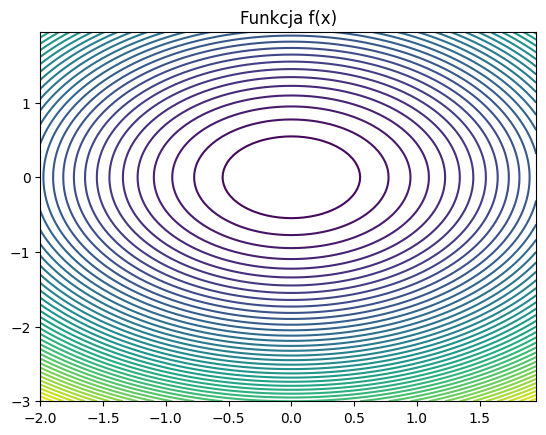

In [ ]:
# Function to analyze
X = np.arange(-2, 2, 0.05)
Y = np.arange(-3, 2, 0.05)
X, Y = np.meshgrid(X, Y)
Z = X**2 + Y**2

# Contour plot en 2D
plt.figure()
plt.title("Funkcja f(x)")
plt.contour(X, Y, Z, 50)

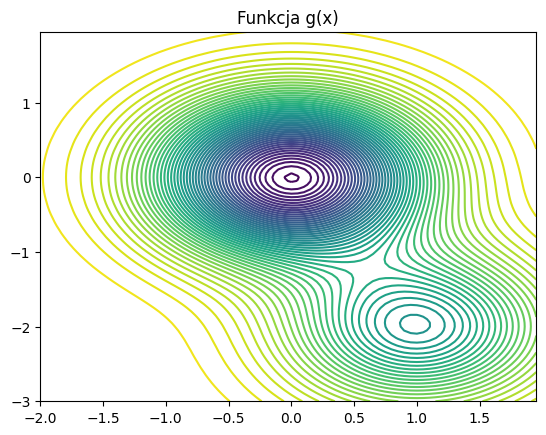

In [ ]:
X = np.arange(-2, 2, 0.05)
Y = np.arange(-3, 2, 0.05)
X, Y = np.meshgrid(X, Y)
Z =1.5-np.exp(-X**(2)-Y**(2))-0.5*np.exp(-(X-1)**(2)-(Y+2)**(2))
# Contour plot en 2D

plt.figure()
plt.title("Funkcja g(x)")
plt.contour(X, Y, Z, 50)

Gradienty funkcji
\begin{equation}
\nabla f(x)=
\begin{bmatrix}
2x_1 \\
2x_2
\end{bmatrix}
\end{equation}

\begin{equation}
\nabla g(x)=
\begin{bmatrix}
2 x_1 \exp \left\{-x_1^2-x_2^2\right\}+\left(x_1-1\right) \exp \left\{-\left(x_1-1\right)^2-\left(x_2+2\right)^2\right\} \\
2 x_2 \exp \left\{-x_1^2-x_2^2\right\}+\left(x_2+2\right) \exp \left\{-\left(x_1-1\right)^2-\left(x_2+2\right)^2\right\}
\end{bmatrix}
\end{equation}

In [ ]:
class SimpleGradientDescent:
    X = np.arange(-2, 2, 0.05)
    Y = np.arange(-3, 2, 0.05)
    X, Y = np.meshgrid(X, Y)

    def __init__(
        self,
        func: Callable[[float, float], float],
        grad_func: Callable[[float, float], Tuple[float, float]],
        alpha: float = 0.1,
    ):
        self.alpha = alpha # learning rate
        self.func = func
        self.grad_func = grad_func
        self.trace = []  # trace of search

    def _calc_Z_value(self):
        self.Z = self.func(self.X, self.Y)

    def plot_func(self, x1_init, x2_init):
        self._calc_Z_value()
        plt.figure()
        plt.contour(self.X, self.Y, self.Z, 50)
        if len(self.trace) > 0:
            plt.scatter(self.trace[:, 0], self.trace[:, 1], s=10)
        plt.title(f"x1_init = {x1_init}, x2_init = {x2_init}, alpha = {self.alpha} endpoint = {self.trace[-1]}")
        plt.xlabel("x1")
        plt.ylabel("x2")
        plt.show()

    def calculate_func_vale(self, x1: float, x2: float) -> float:
        # value of the function in point (x1, x2)
        return self.func(x1, x2)

    def calculate_func_grad(self, x1: float, x2: float) -> Tuple[float, float]:
        # value of function gradient in point (x1, x2)
        return self.grad_func(x1, x2)

    def gradient_descent_step(self, x1: float, x2: float) -> Tuple[float, float]:
        # θ_t+1 = θ_t −η∇f(θ_t), where:
        #  θ_t -----> x1, x2 (current point)
        #  θ_t+1 ---> x1_new, x2_new (next point)
        #  η -------> alpha (leaning rate)
        #  ∇f(θ_t) -> grad_x1, grad_x2 (value of function gradient in point (x1, x2))
        grad_x1, grad_x2 = self.calculate_func_grad(x1, x2)
        x1_new = x1 - self.alpha * grad_x1
        x2_new = x2 - self.alpha * grad_x2
        return x1_new, x2_new

    def minimize(
        self,
        x1_init: float,
        x2_init: float,
        steps: int,
        verbose: int = 0,
        plot: bool = False,
    ) -> float:
        x1, x2 = x1_init, x2_init
        # initial point is the first one in trace
        self.trace = [(x1, x2)]

        # repeat gradient descent {steps} times
        for i in range(steps):
            x1, x2 = self.gradient_descent_step(x1, x2)
            self.trace.append((x1, x2))

            if verbose == 1:
                print(f"Step {i+1}: x1 = {x1:.3f}, x2 = {x2:.3f}, f(x) = {self.calculate_func_vale(x1, x2):.3f}")

        # project trace onto np.array (matrix format required when scattering)
        self.trace = np.array(self.trace)

        if plot:
            self.plot_func(x1_init, x2_init)

        # return the value of function at the last point in trace (assumingly closest to solution)
        return self.calculate_func_vale(x1, x2)

# Rozwiązanie

## Funkcja 1

In [ ]:
def function_f(x1: float, x2: float) -> float:
    return x1**2 + x2**2

def gradient_f(x1: float, x2: float) -> Tuple[float, float]:
    return (2*x1, 2*x2)

def test_gradient_descent_f(x1:float, x2:float, steps:int = 50, alpha:float = 0.1, verbose:int = 0, plot:bool = True):
    gradient_descent_f = SimpleGradientDescent(func=function_f, grad_func=gradient_f, alpha=alpha)
    solution_f = gradient_descent_f.minimize(x1_init=x1, x2_init=x2, steps=steps, verbose=verbose, plot=plot)
    if verbose != 0:
        print(f"Solution for function f is: {solution_f}")


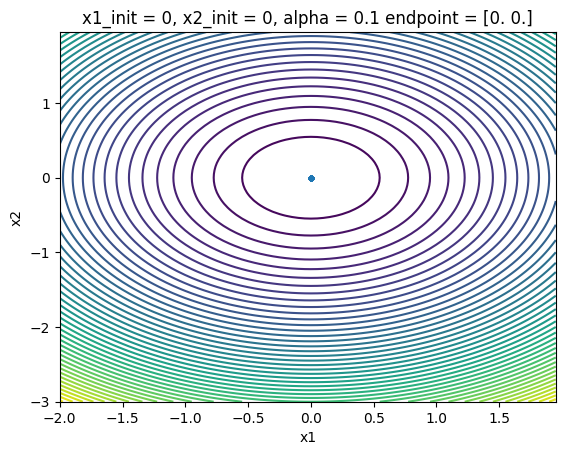

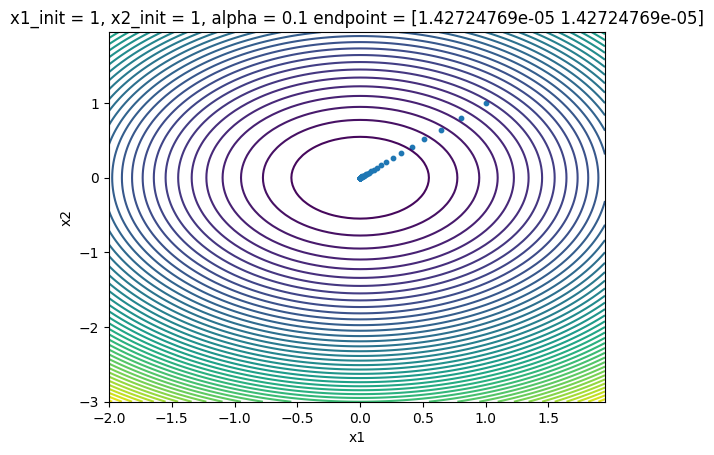

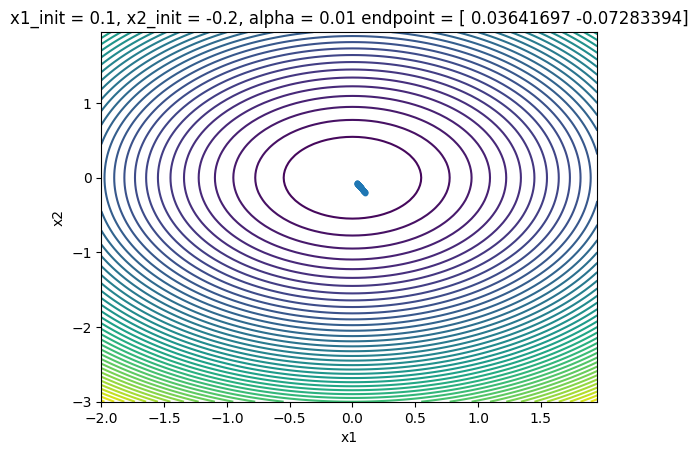

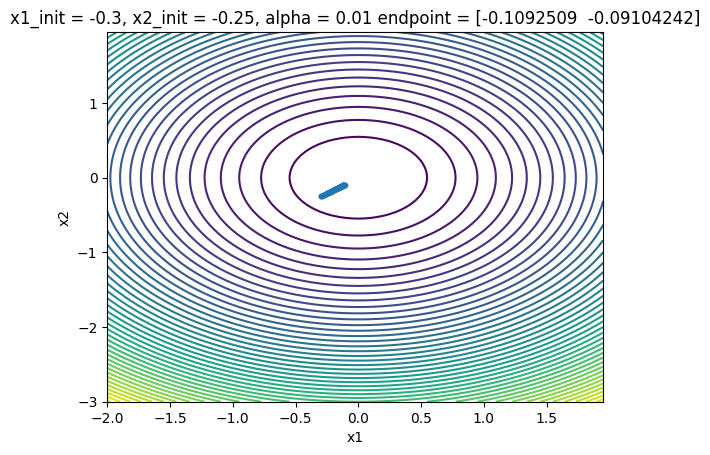

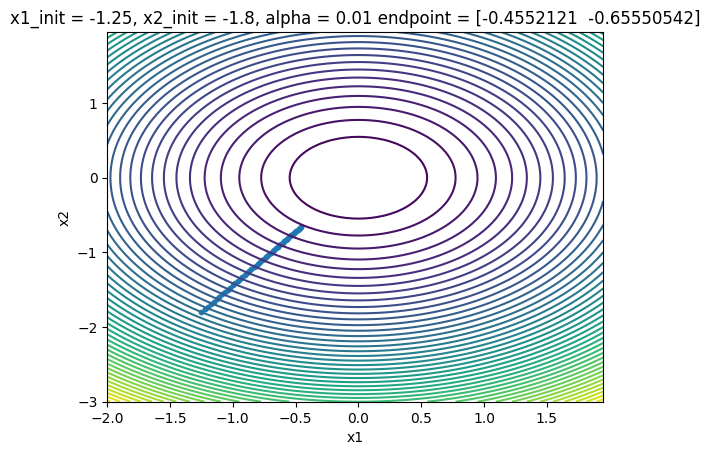

...

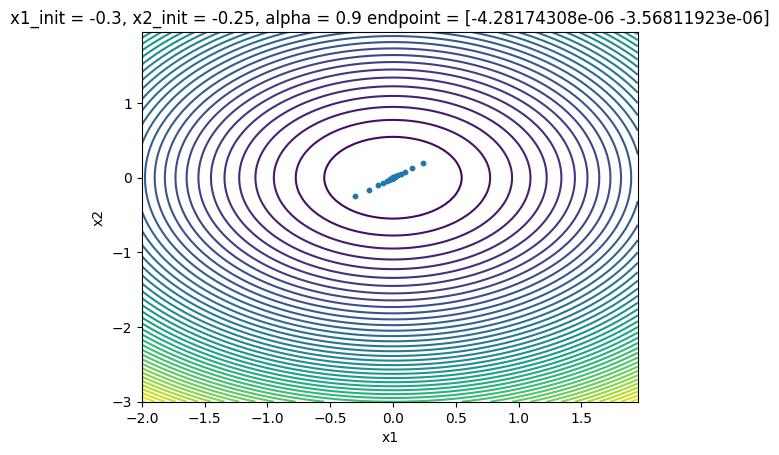

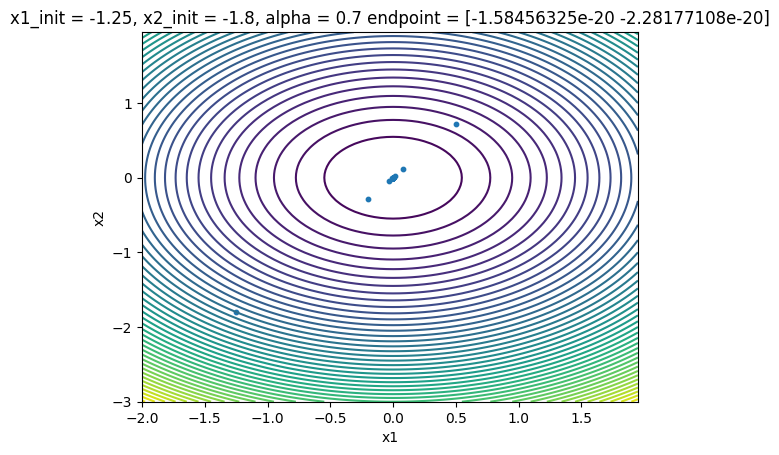

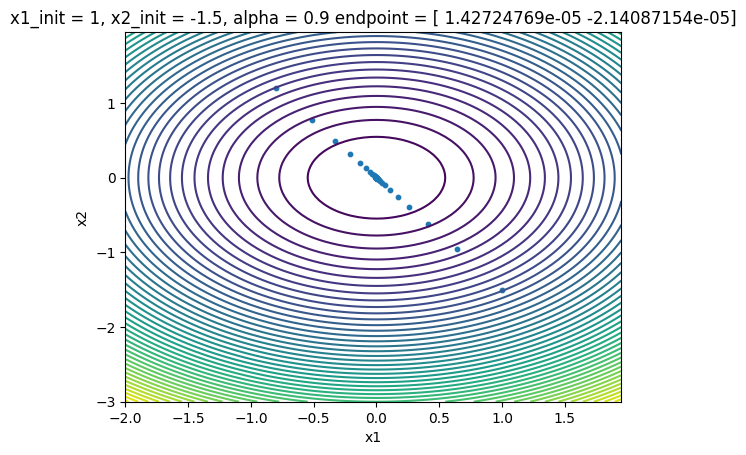

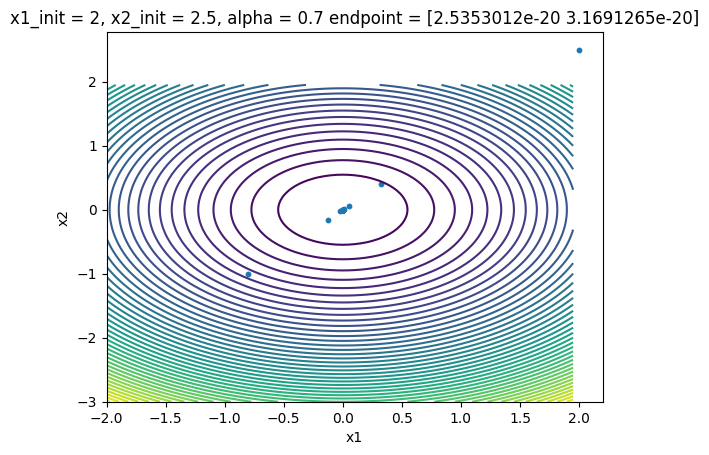

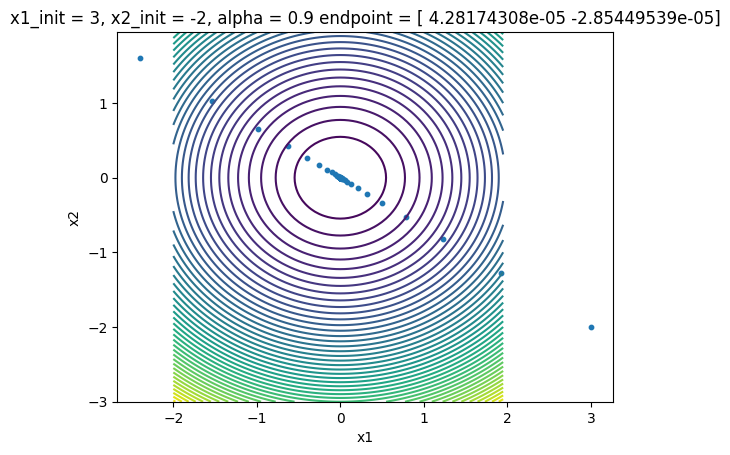

In [ ]:
def main():
    # control sample
    test_gradient_descent_f(x1=0, x2=0, steps=50, alpha=0.1, verbose=0, plot=True)

    # correct solution
    test_gradient_descent_f(x1=1, x2=1, steps=50, alpha=0.1, verbose=0, plot=True)

    # *** actual examples ***

    # A) slow learning rate

    # 1) slow learning rate and near (0, 0)
    test_gradient_descent_f(x1=0.1, x2=-0.2, steps=50, alpha=0.01, verbose=0, plot=True)
    test_gradient_descent_f(x1=-0.3, x2=-0.25, steps=50, alpha=0.01, verbose=0, plot=True)

    # 2) slow learning rate and medium distance from (0, 0)
    test_gradient_descent_f(x1=-1.25, x2=-1.8, steps=50, alpha=0.01, verbose=0, plot=True)
    test_gradient_descent_f(x1=1, x2=-1.5, steps=50, alpha=0.01, verbose=0, plot=True)

    # 3) slow learning rate and fair distance from (0, 0)
    test_gradient_descent_f(x1=2, x2=2.5, steps=50, alpha=0.01, verbose=0, plot=True)
    test_gradient_descent_f(x1=3, x2=-2, steps=50, alpha=0.01, verbose=0, plot=True)

    # B) medium learning rate

    # 4) medium learning rate and near (0, 0)
    test_gradient_descent_f(x1=0.1, x2=-0.2, steps=50, alpha=0.1, verbose=0, plot=True)
    test_gradient_descent_f(x1=-0.3, x2=-0.25, steps=50, alpha=0.1, verbose=0, plot=True)

    # 5) slow learning rate and medium distance from (0, 0)
    test_gradient_descent_f(x1=-1.25, x2=-1.8, steps=50, alpha=0.1, verbose=0, plot=True)
    test_gradient_descent_f(x1=1, x2=-1.5, steps=50, alpha=0.1, verbose=0, plot=True)

    # 6) slow learning rate and fair distance from (0, 0)
    test_gradient_descent_f(x1=2, x2=2.5, steps=50, alpha=0.1, verbose=0, plot=True)
    test_gradient_descent_f(x1=3, x2=-2, steps=50, alpha=0.1, verbose=0, plot=True)


    # C) high learning rate

    # 7) high learning rate and near (0, 0)
    test_gradient_descent_f(x1=0.1, x2=-0.2, steps=50, alpha=0.7, verbose=0, plot=True)
    test_gradient_descent_f(x1=-0.3, x2=-0.25, steps=50, alpha=0.9, verbose=0, plot=True)

    # 8) high learning rate and medium distance from (0, 0)
    test_gradient_descent_f(x1=-1.25, x2=-1.8, steps=50, alpha=0.7, verbose=0, plot=True)
    test_gradient_descent_f(x1=1, x2=-1.5, steps=50, alpha=0.9, verbose=0, plot=True)

    # 9) high learning rate and fair distance from (0, 0)
    test_gradient_descent_f(x1=2, x2=2.5, steps=50, alpha=0.7, verbose=0, plot=True)
    test_gradient_descent_f(x1=3, x2=-2, steps=50, alpha=0.9, verbose=0, plot=True)


if __name__ == "__main__":
    main()

## Funkcja 2

In [ ]:
def function_g(x1: float, x2: float) -> float:
    return 1.5 - np.exp(-x1**2 - x2**2) - 0.5*np.exp(-(x1-1)**2 -(x2+2)**2)

def gradient_g(x1: float, x2: float) -> Tuple[float, float]:
    row1: float = 2*x1*np.exp(-x1**2 - x2**2) + (x1-1)*np.exp(-(x1-1)**2 - (x2+2)**2)
    row2: float = 2*x2*np.exp(-x1**2 - x2**2) + (x2+2)*np.exp(-(x1-1)**2 - (x2+2)**2)
    return (row1, row2)

def test_gradient_descent_g(x1:float, x2:float, steps:int = 50, alpha:float = 0.1, verbose:int = 0, plot:bool = True):
    gradient_descent_g = SimpleGradientDescent(func=function_g, grad_func=gradient_g, alpha=alpha)
    solution_g = gradient_descent_g.minimize(x1_init=x1, x2_init=x2, steps=steps, verbose=verbose, plot=plot)
    if verbose != 0:
        print(f"Solution for function g is: {solution_g}")


Dla małych wartości alpha (eta) metoda prostego gradientu wykonuje bardzo małe kroki, co oznacza, że w dużej ilości przypadków (szczególnie dla punktów początkowych odległych od optimum) ostatni punkt trace'a pozostaje w oddaleniu od optimum.

Średnie wartości alpha bardzo często wywołują sprowadzenie poszukiwań do optimum, jednakże jest zagrożona "złapaniem" przez optimum lokalne, a nie globalne, przez co wynik może potencjalnie być błędny.

Dla dużych wartości alpha, wykonuje się duży krok, którego punkt znajduje się po drugiej stronie optimum. Następny krok też moż paść tym samym losem, co kończy się oscylacją punktów wokół optimum. Jednakżę duże wartości alpha, przez to, że wykonują duże kroki mogą "uwolnić się" z optimum lokalnego i wpaść na optimum globalne. Aczkolwiek może też stać się odwrotnie.

Dla bardzo dużych wartości alpha kroki są chaotyczne i bardzo rzadko kończą się znalezieniem jakiego kolwiek optimum, a tym rzadziej optimum globalnego.

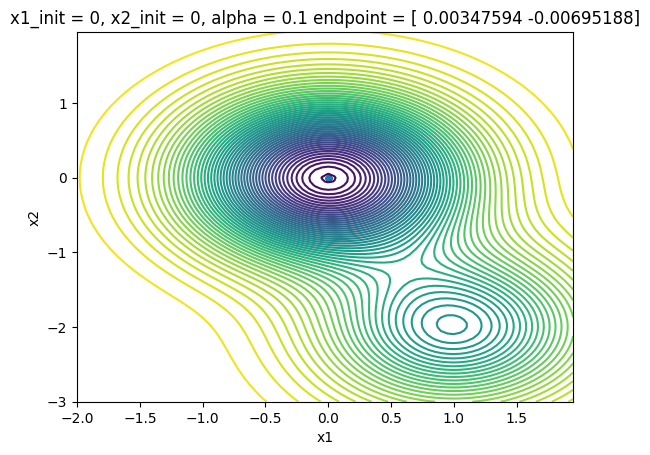

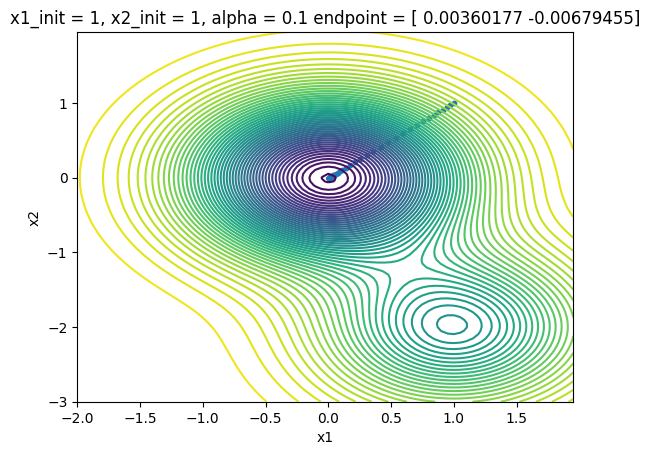

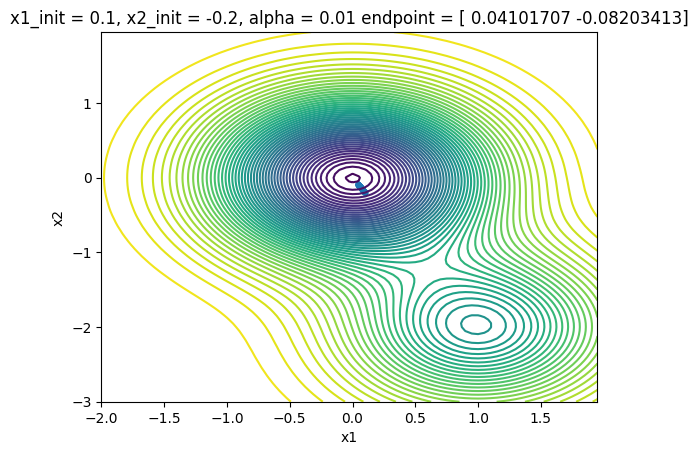

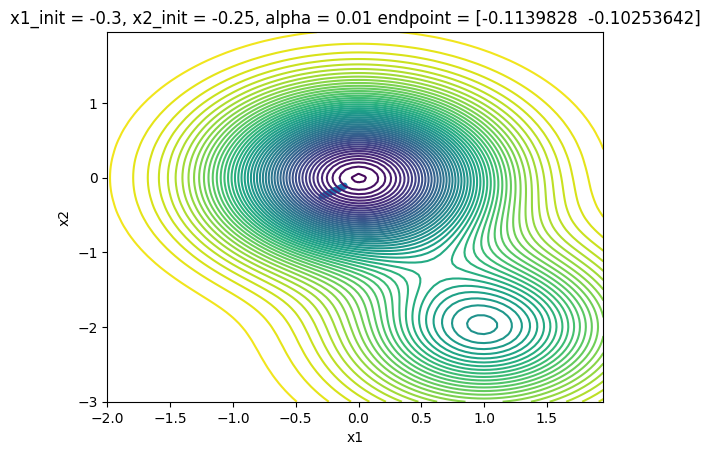

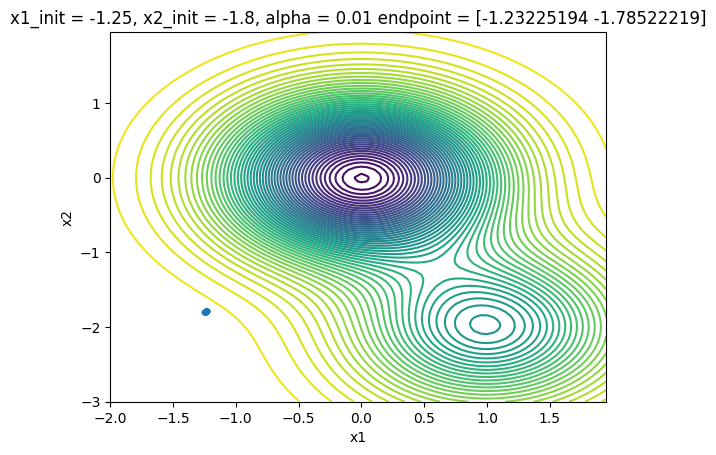

...

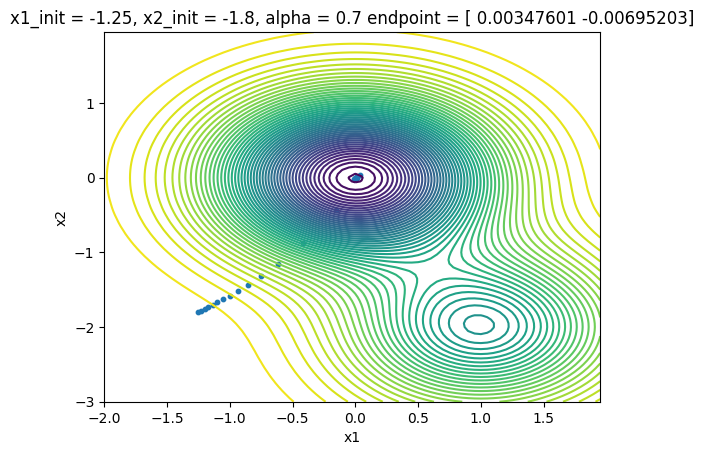

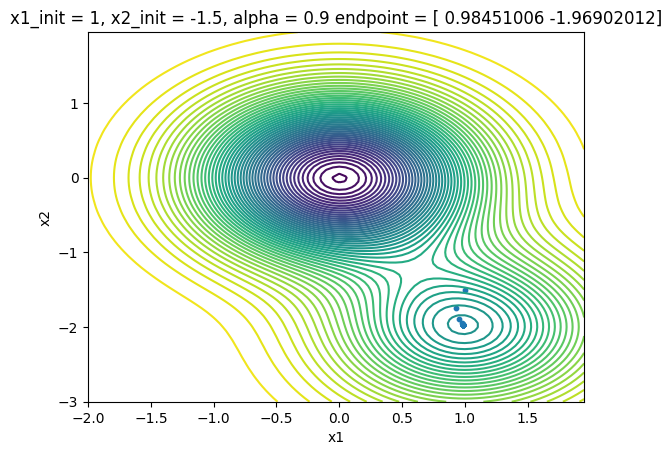

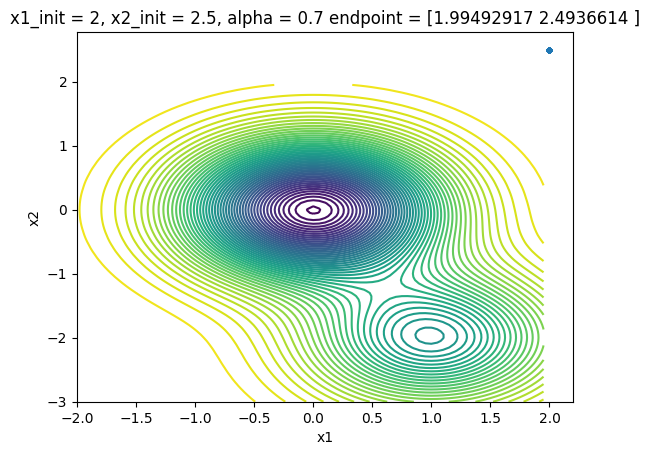

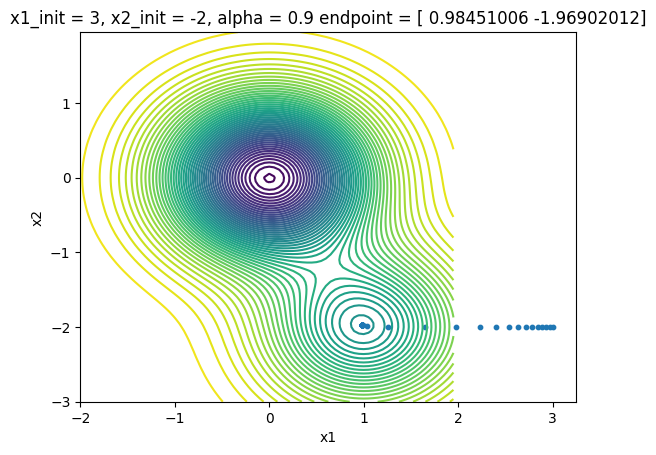

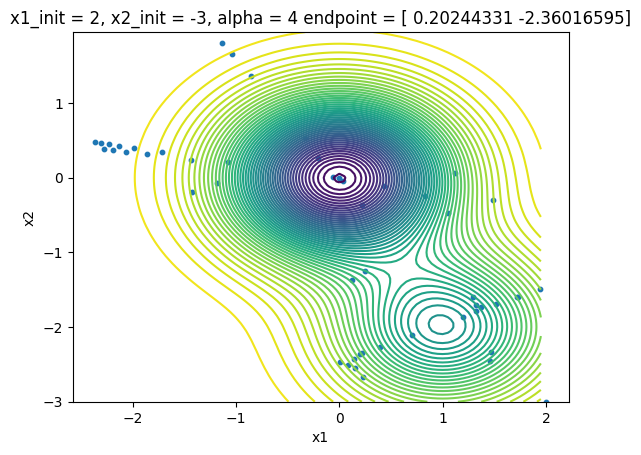

In [ ]:
def main():
    # control sample
    test_gradient_descent_g(x1=0, x2=0, steps=50, alpha=0.1, verbose=0, plot=True)

    # correct solution
    test_gradient_descent_g(x1=1, x2=1, steps=50, alpha=0.1, verbose=0, plot=True)

    # *** actual examples ***

    # A) slow learning rate

    # 1) slow learning rate and near (0, 0)
    test_gradient_descent_g(x1=0.1, x2=-0.2, steps=50, alpha=0.01, verbose=0, plot=True)
    test_gradient_descent_g(x1=-0.3, x2=-0.25, steps=50, alpha=0.01, verbose=0, plot=True)

    # 2) slow learning rate and medium distance from (0, 0)
    test_gradient_descent_g(x1=-1.25, x2=-1.8, steps=50, alpha=0.01, verbose=0, plot=True)
    test_gradient_descent_g(x1=1, x2=-1.5, steps=50, alpha=0.01, verbose=0, plot=True)

    # 3) slow learning rate and fair distance from (0, 0)
    test_gradient_descent_g(x1=2, x2=2.5, steps=50, alpha=0.01, verbose=0, plot=True)
    test_gradient_descent_g(x1=3, x2=-2, steps=50, alpha=0.01, verbose=0, plot=True)

    # B) medium learning rate

    # 4) medium learning rate and near (0, 0)
    test_gradient_descent_g(x1=0.1, x2=-0.2, steps=50, alpha=0.1, verbose=0, plot=True)
    test_gradient_descent_g(x1=-0.3, x2=-0.25, steps=50, alpha=0.1, verbose=0, plot=True)

    # 5) slow learning rate and medium distance from (0, 0)
    test_gradient_descent_g(x1=-1.25, x2=-1.8, steps=50, alpha=0.1, verbose=0, plot=True)
    test_gradient_descent_g(x1=1, x2=-1.5, steps=50, alpha=0.1, verbose=0, plot=True)

    # 6) slow learning rate and fair distance from (0, 0)
    test_gradient_descent_g(x1=2, x2=2.5, steps=50, alpha=0.1, verbose=0, plot=True)
    test_gradient_descent_g(x1=3, x2=-2, steps=50, alpha=0.1, verbose=0, plot=True)


    # C) high learning rate

    # 7) high learning rate and near (0, 0)
    test_gradient_descent_g(x1=0.1, x2=-0.2, steps=50, alpha=0.7, verbose=0, plot=True)
    test_gradient_descent_g(x1=-0.3, x2=-0.25, steps=50, alpha=0.9, verbose=0, plot=True)

    # 8) high learning rate and medium distance from (0, 0)
    test_gradient_descent_g(x1=-1.25, x2=-1.8, steps=50, alpha=0.7, verbose=0, plot=True)
    test_gradient_descent_g(x1=1, x2=-1.5, steps=50, alpha=0.9, verbose=0, plot=True)

    # 9) high learning rate and fair distance from (0, 0)
    test_gradient_descent_g(x1=2, x2=2.5, steps=50, alpha=0.7, verbose=0, plot=True)
    test_gradient_descent_g(x1=3, x2=-2, steps=50, alpha=0.9, verbose=0, plot=True)
    test_gradient_descent_g(x1=2, x2=-3, steps=50, alpha=4, verbose=0, plot=True)


if __name__ == "__main__":
    main()